# Brain Tumor Object Detection<br>
Implementing a brain tumor detection system using YOLOv8. Curate a diverse dataset, annotate images, and train models for accurate detection. Emphasizing ethical healthcare data usage, this project seeks robust precision and recall in identifying brain tumors through the YOLOv8 along with different sizes and optimizers.

## **Data Collection**

[Dataset](https://www.kaggle.com/datasets/ammarahmed310/labeled-mri-brain-tumor-dataset)<br>
A comprehensive dataset consisting of brain scans from multiple imaging modalities, including MRI, has been chosen for the training of the YOLOv8 model. The dataset has been carefully selected to provide exposure to a wide variety of clinical situations, including cases of pituitary, meningioma, glioma, and no tumor. The dataset was obtained from Kagle. The specifications of the dataset, consisting of 1594 healthy brain samples, 1321 glioma, 1339 meningioma, and 1457 pituitary brain tumor samples.

## Importing Libraries

In [ ]:
!nvidia-smi

Tue Apr 15 01:04:20 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   40C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
!pip install Augmentor
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 974.8/974.8 kB 21.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 51.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 31.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 46.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 41.6 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.patches as patches
import cv2
import math
import os
import zipfile
import random
import shutil
import Augmentor
from sklearn.model_selection import train_test_split
from ultralytics import YOLO
from PIL import Image
from IPython.display import display

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [ ]:
# Pip install method (recommended)

!pip install ultralytics==8.2.51

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics 8.3.108 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 41.2/112.6 GB disk)


In [ ]:
from ultralytics import YOLO

from IPython.display import display, Image


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/MyDrive/brain_tumor_object_detection


/content/drive/MyDrive/brain_tumor_object_detection


In [ ]:
!ls

brain_tumor_object_detection.ipynb	    data.yaml  yolo11n.pt  yolov8s.pt
brain_tumor_object_detection_Shibina.ipynb  runs       yolov8m.pt
dataset					    wandb      yolov8n.pt


In [ ]:
!pip install roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.2/85.2 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 22.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 111.7 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.11.0.86
    Uninstalling opencv-python-headless-4.11.0.86:
      Successfully uninstalled opencv-python-headless-4.11.0.86
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10


In [ ]:
import roboflow as rf
import matplotlib.pyplot as plt

In [ ]:
%cd /content/drive/MyDrive/brain_tumor_object_detection

# !yolo task=detect mode=train model=yolov8s.pt data= data.yaml epochs=5 imgsz=640 plots=True

/content/drive/MyDrive/brain_tumor_object_detection


In [ ]:
! pip install --upgrade torch torchvision torchaudio
! pip install --upgrade ultralytics

  Using cached ultralytics-8.3.108-py3-none-any.whl.metadata (37 kB)
Using cached ultralytics-8.3.108-py3-none-any.whl (974 kB)
  Attempting uninstall: ultralytics
    Found existing installation: ultralytics 8.2.51
    Uninstalling ultralytics-8.2.51:
      Successfully uninstalled ultralytics-8.2.51


In [ ]:
from ultralytics import YOLO

# Load the model
model = YOLO('yolov8s.pt')  # No need for weights_only argument

# **Yolo9**

In [ ]:
!yolo task=detect mode=train model=yolov9s.pt data= data.yaml epochs=5 imgsz=640 plots=True

100% 14.7M/14.7M [00:00<00:00, 90.6MB/s]
Ultralytics 8.3.108 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov9s.pt, data=data.yaml, epochs=5, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train20, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, sho

In [ ]:
!ls runs/detect/train20

args.yaml					     results.png
confusion_matrix_normalized.png			     train_batch0.jpg
confusion_matrix.png				     train_batch1.jpg
events.out.tfevents.1744681218.e5dd2cdac3f8.22733.0  train_batch2.jpg
F1_curve.png					     val_batch0_labels.jpg
labels_correlogram.jpg				     val_batch0_pred.jpg
labels.jpg					     val_batch1_labels.jpg
P_curve.png					     val_batch1_pred.jpg
PR_curve.png					     val_batch2_labels.jpg
R_curve.png					     val_batch2_pred.jpg
results.csv					     weights


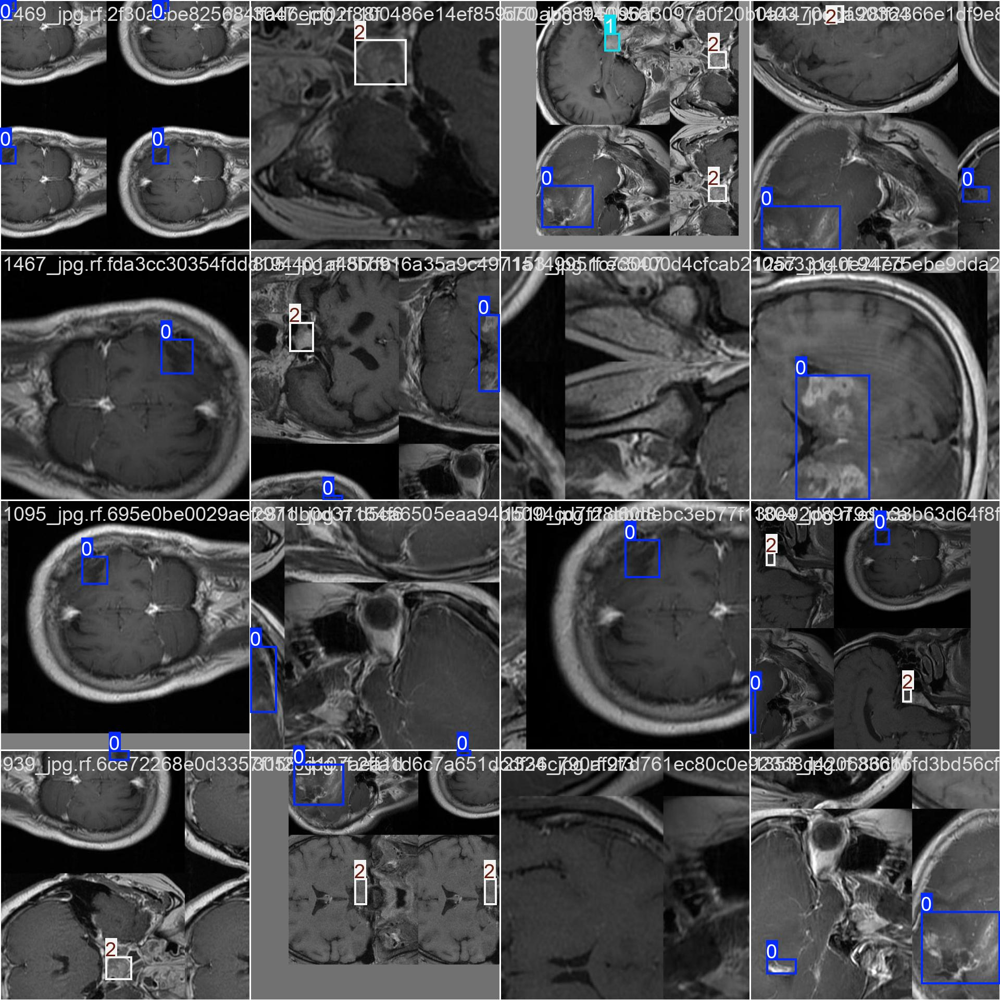

In [ ]:
Image(filename='runs/detect/train20/train_batch0.jpg', width=800)

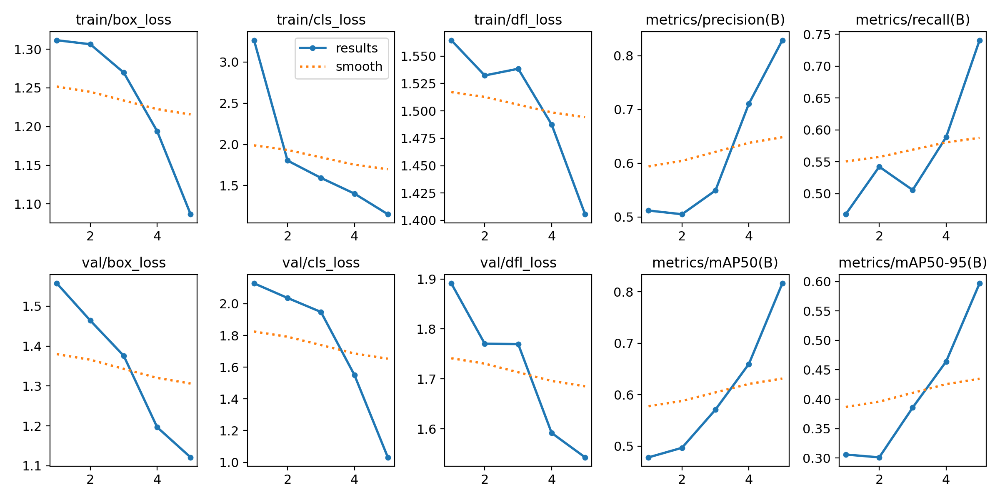

In [ ]:
Image(filename='runs/detect/train20/results.png', width=800)

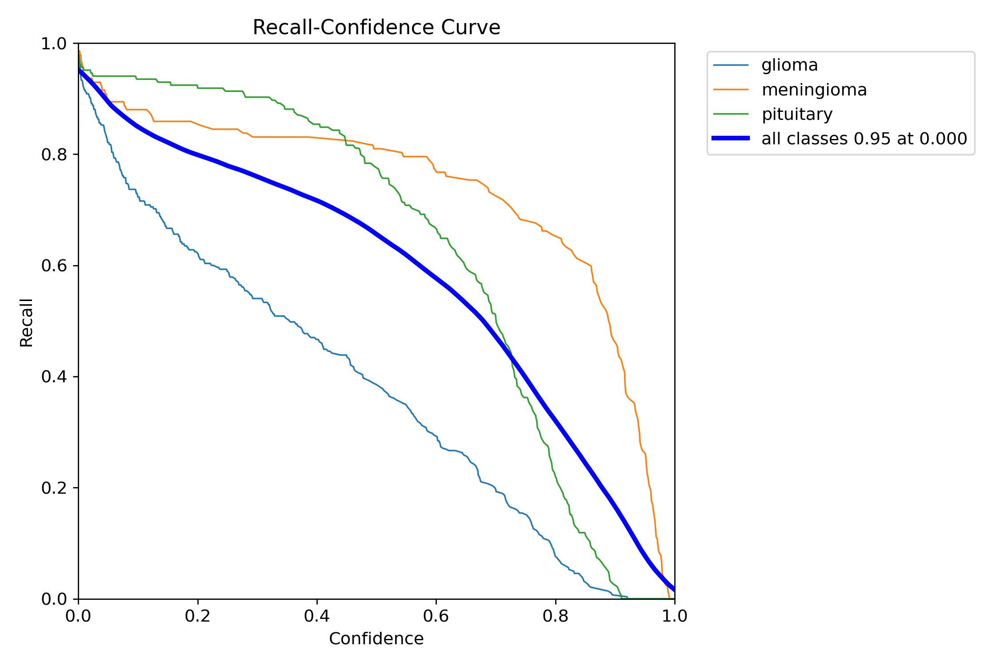

In [ ]:
Image(filename='runs/detect/train20/R_curve.png', width=800)

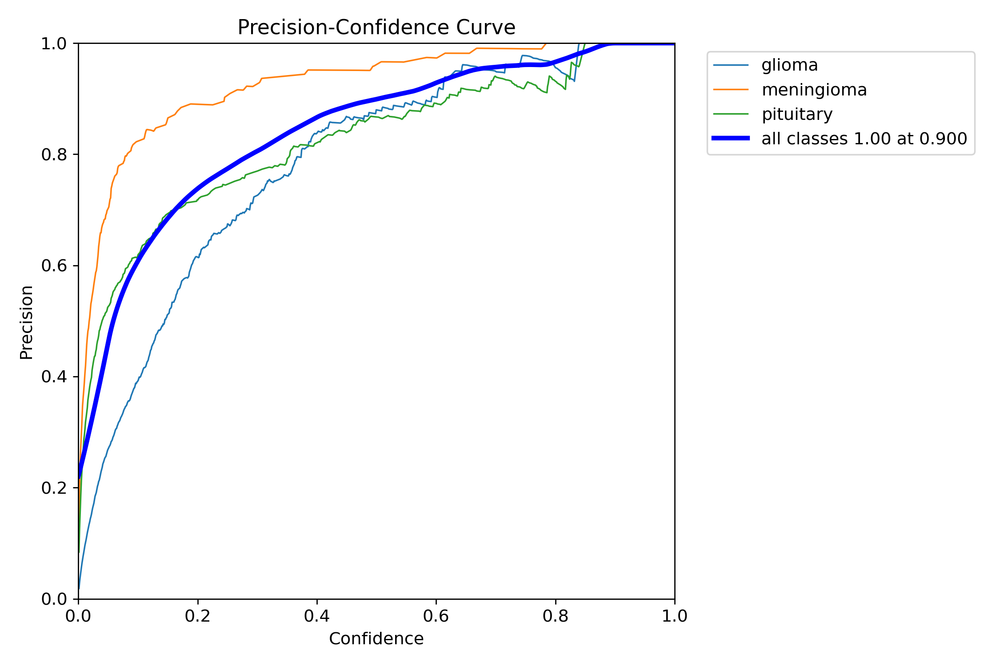

In [ ]:
Image(filename='runs/detect/train20/P_curve.png', width=800)

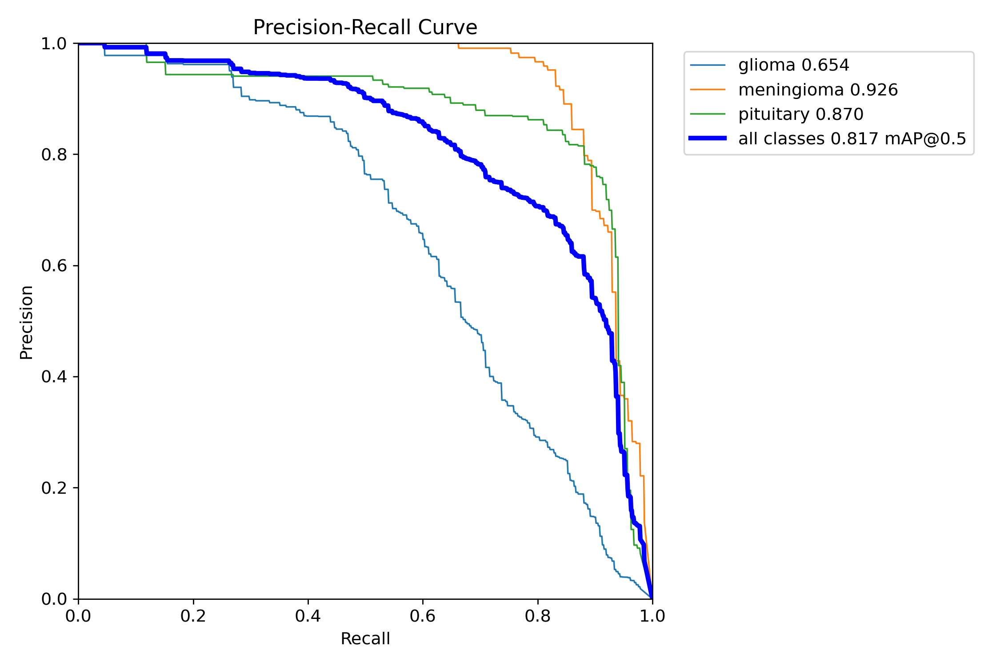

In [ ]:
Image(filename='runs/detect/train20/PR_curve.png', width=800)

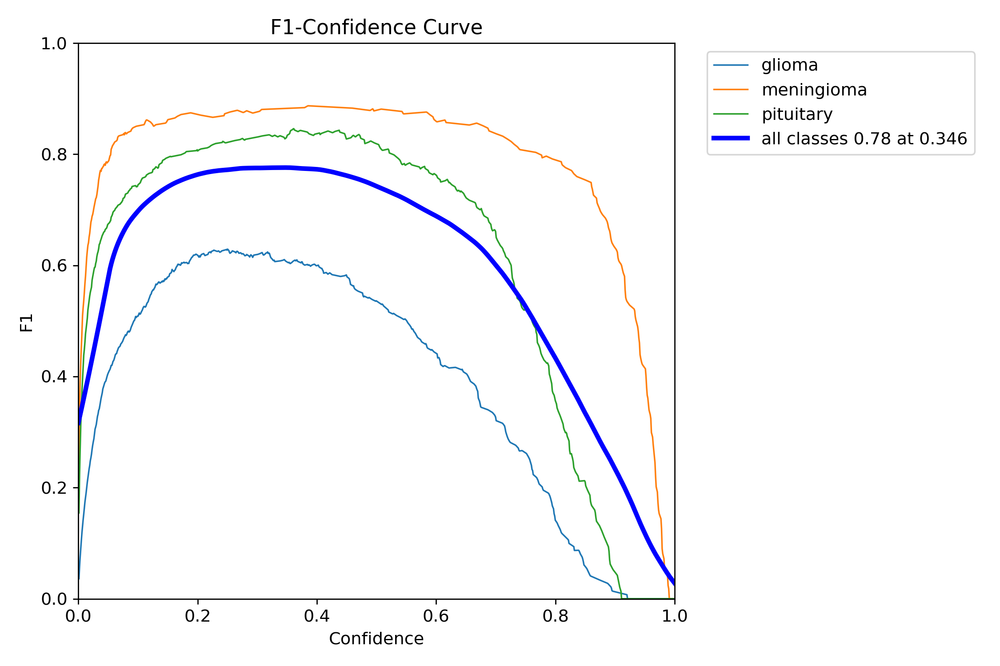

In [ ]:
Image(filename='runs/detect/train20/F1_curve.png', width=800)

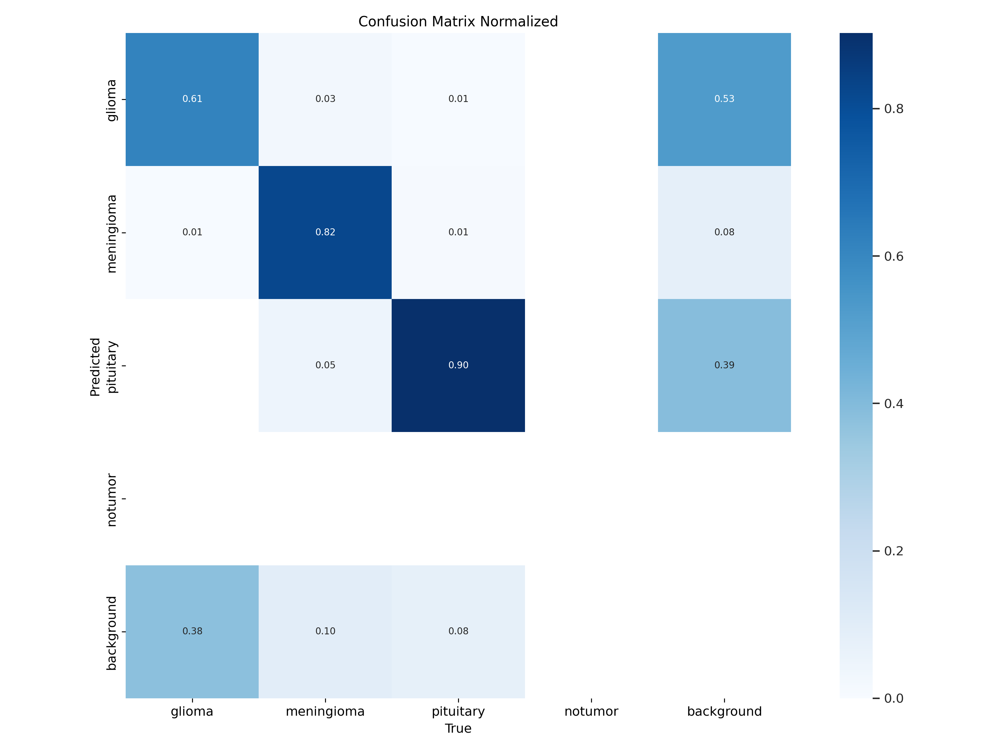

In [ ]:
Image(filename='runs/detect/train20/confusion_matrix_normalized.png', width=800)

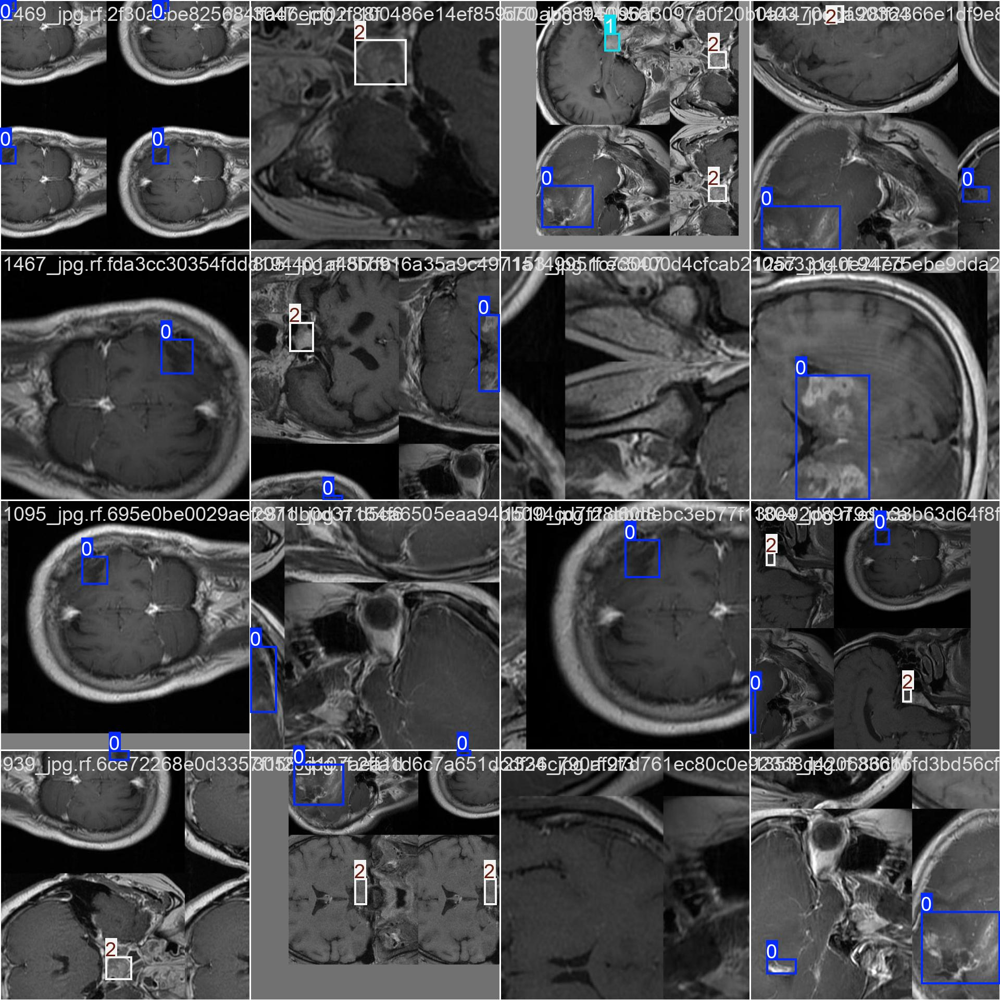

In [ ]:
Image(filename='runs/detect/train20/train_batch0.jpg', width=800)

# **Yolo8**

In [ ]:
!yolo task=detect mode=train model=yolov8s.pt data= data.yaml epochs=5 imgsz=640 plots=True

Ultralytics 8.3.108 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=data.yaml, epochs=5, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train19, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None, format=tor

In [ ]:
!ls runs/detect/train19

args.yaml					     results.png
confusion_matrix_normalized.png			     train_batch0.jpg
confusion_matrix.png				     train_batch1.jpg
events.out.tfevents.1744679623.e5dd2cdac3f8.15870.0  train_batch2.jpg
F1_curve.png					     val_batch0_labels.jpg
labels_correlogram.jpg				     val_batch0_pred.jpg
labels.jpg					     val_batch1_labels.jpg
P_curve.png					     val_batch1_pred.jpg
PR_curve.png					     val_batch2_labels.jpg
R_curve.png					     val_batch2_pred.jpg
results.csv					     weights


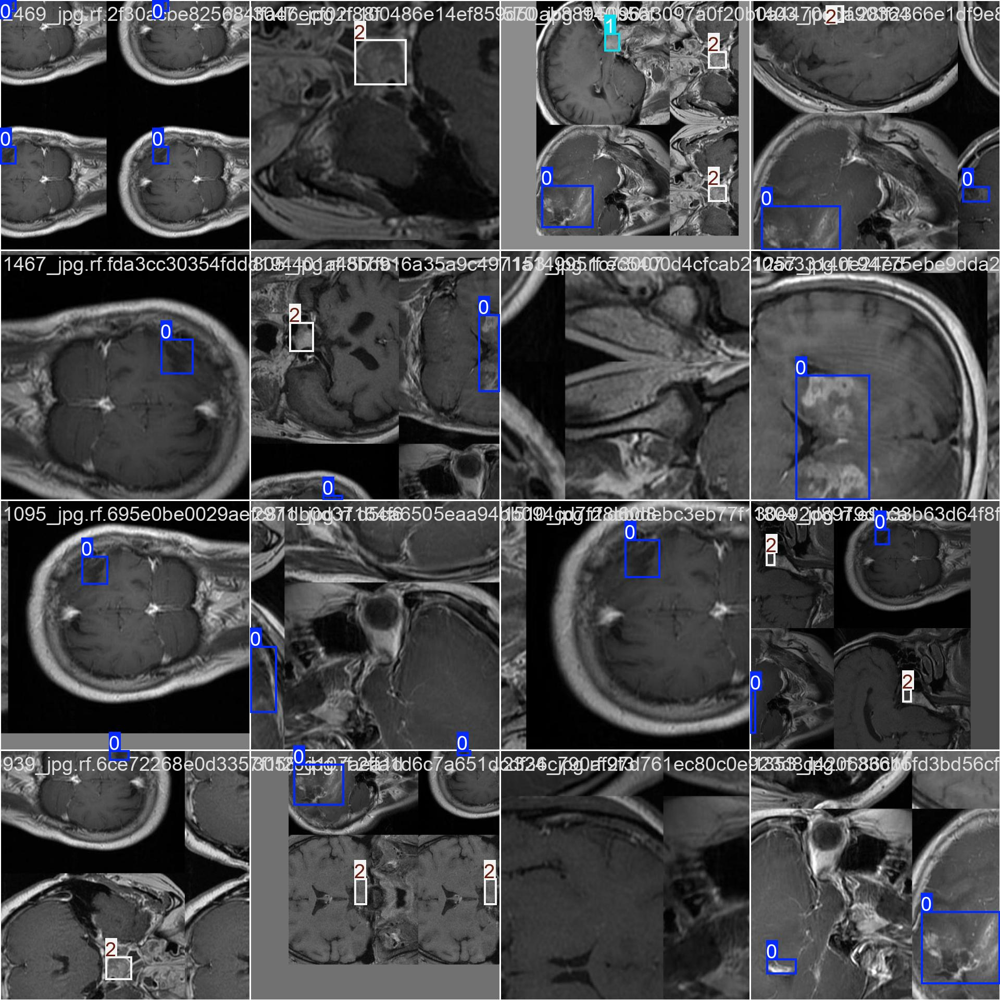

In [ ]:
Image(filename='runs/detect/train19/train_batch0.jpg', width=800)

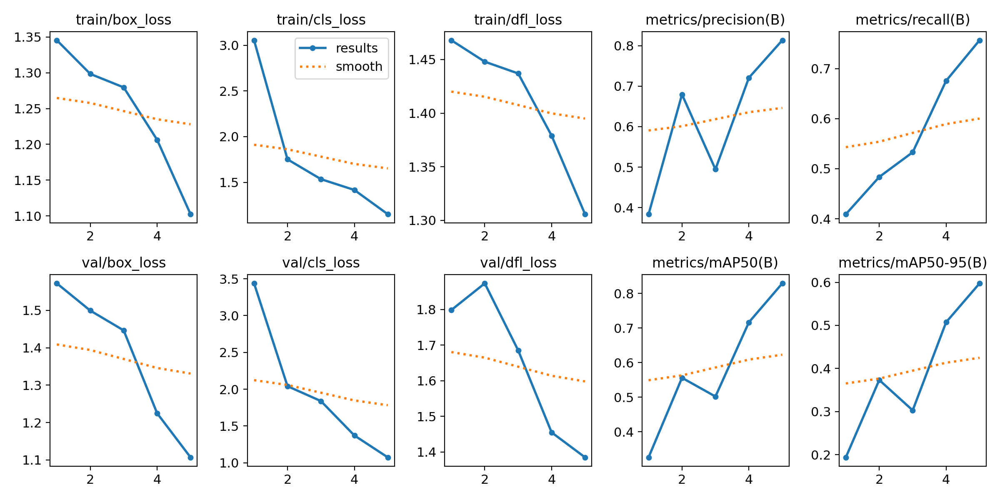

In [ ]:
Image(filename='runs/detect/train19/results.png', width=800)

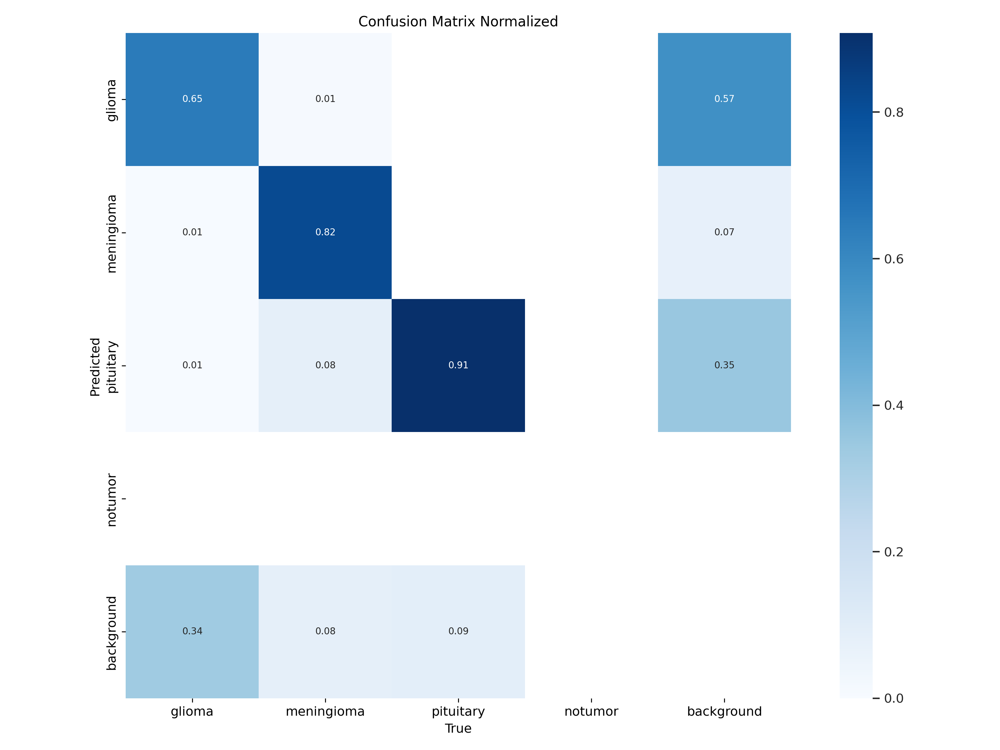

In [ ]:
Image(filename='runs/detect/train19/confusion_matrix_normalized.png', width=800)

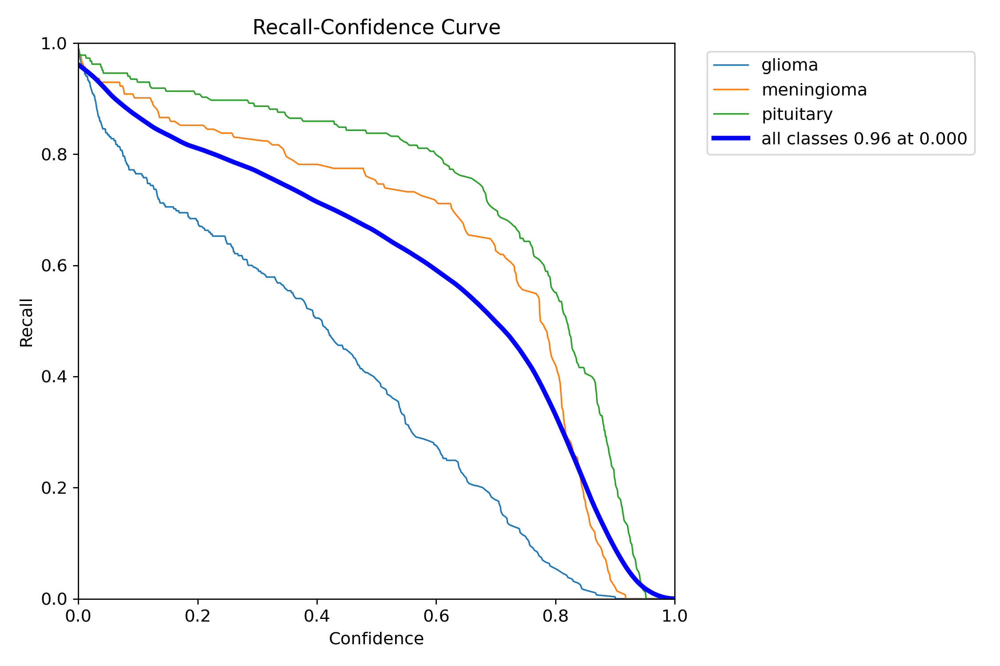

In [ ]:
Image(filename='runs/detect/train19/R_curve.png', width=800)

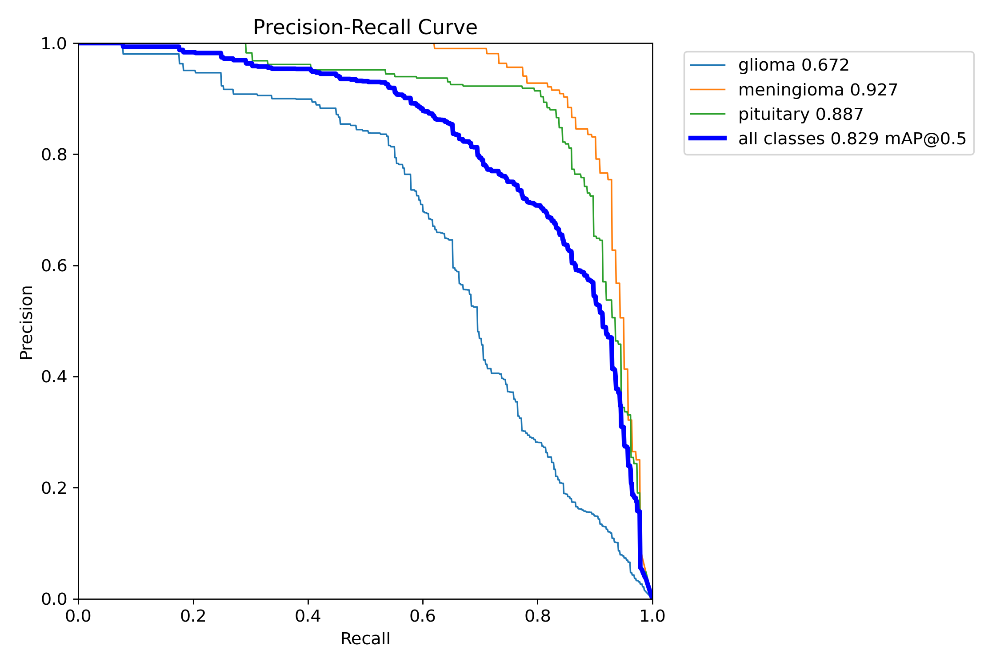

In [ ]:
Image(filename='runs/detect/train19/PR_curve.png', width=800)

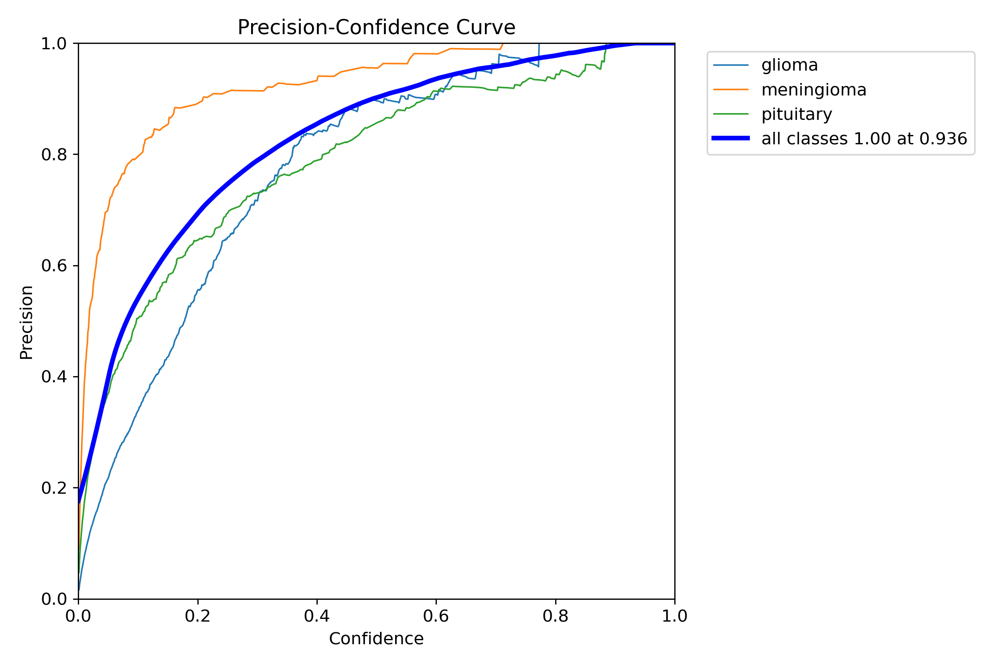

In [ ]:
Image(filename='runs/detect/train19/P_curve.png', width=800)

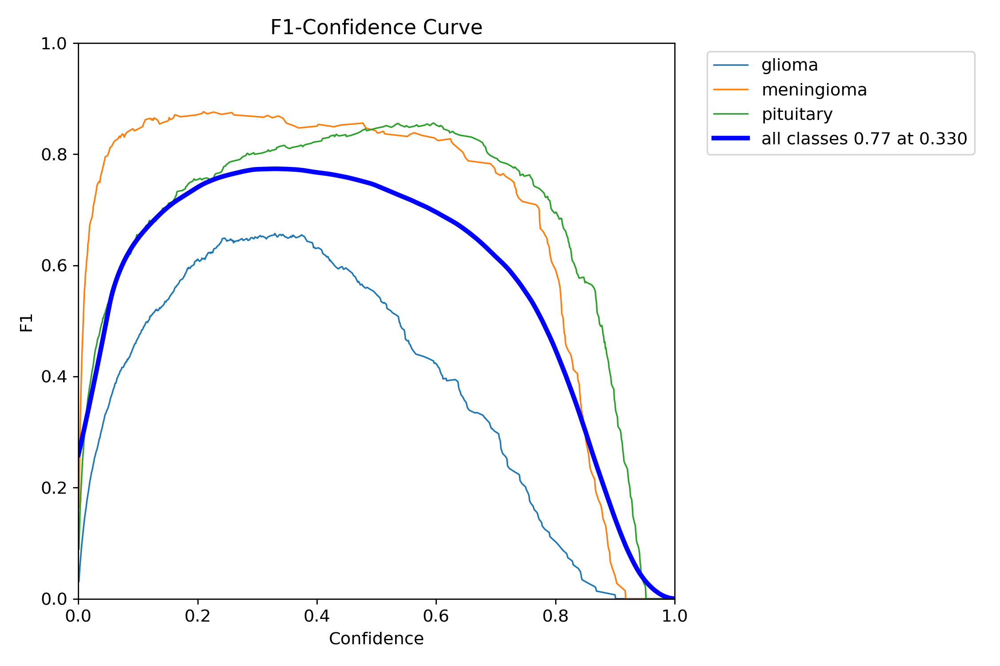

In [ ]:
Image(filename='runs/detect/train19/F1_curve.png', width=800)

In [ ]:
!ls runs/detect/train17

args.yaml					     train_batch1.jpg
confusion_matrix_normalized.png			     train_batch2680.jpg
confusion_matrix.png				     train_batch2681.jpg
events.out.tfevents.1744669589.18b7336096b6.18536.0  train_batch2682.jpg
F1_curve.png					     train_batch2.jpg
labels_correlogram.jpg				     val_batch0_labels.jpg
labels.jpg					     val_batch0_pred.jpg
P_curve.png					     val_batch1_labels.jpg
PR_curve.png					     val_batch1_pred.jpg
R_curve.png					     val_batch2_labels.jpg
results.csv					     val_batch2_pred.jpg
results.png					     weights
train_batch0.jpg


In [ ]:
from IPython.display import Image, display

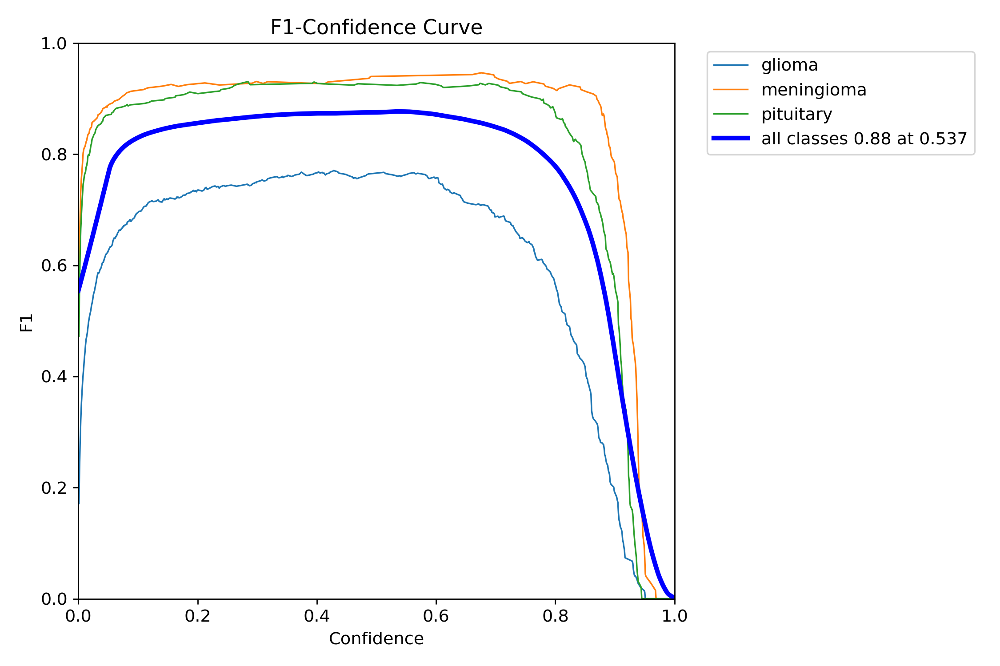

In [ ]:
Image(filename='runs/detect/train17/F1_curve.png', width=800)

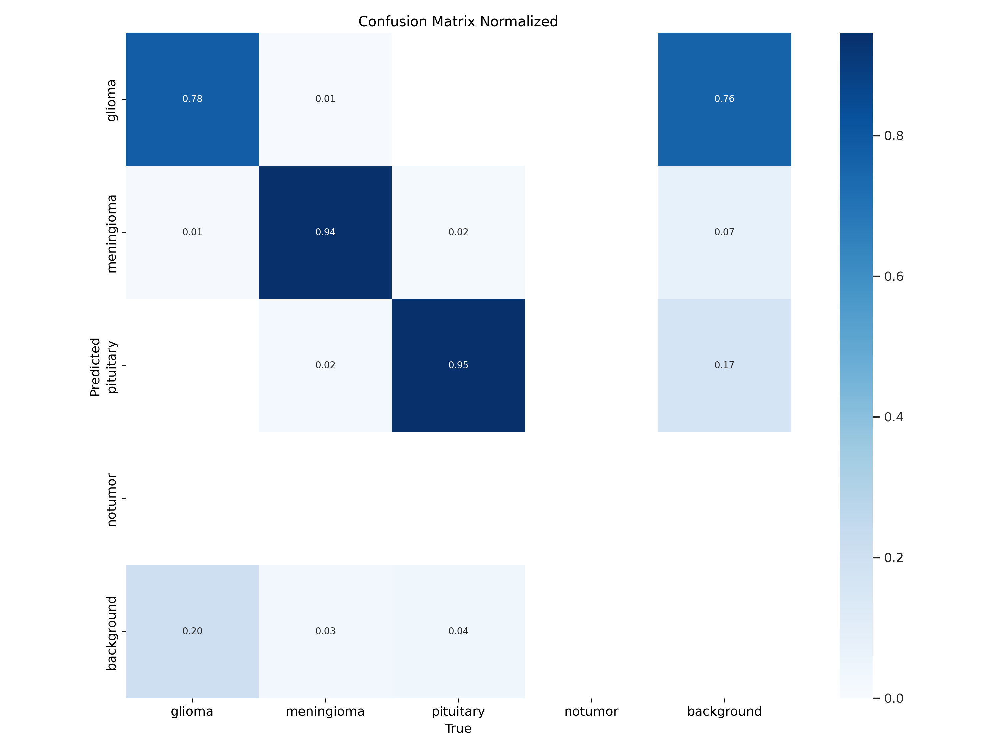

In [ ]:
Image(filename='runs/detect/train17/confusion_matrix_normalized.png', width=800)

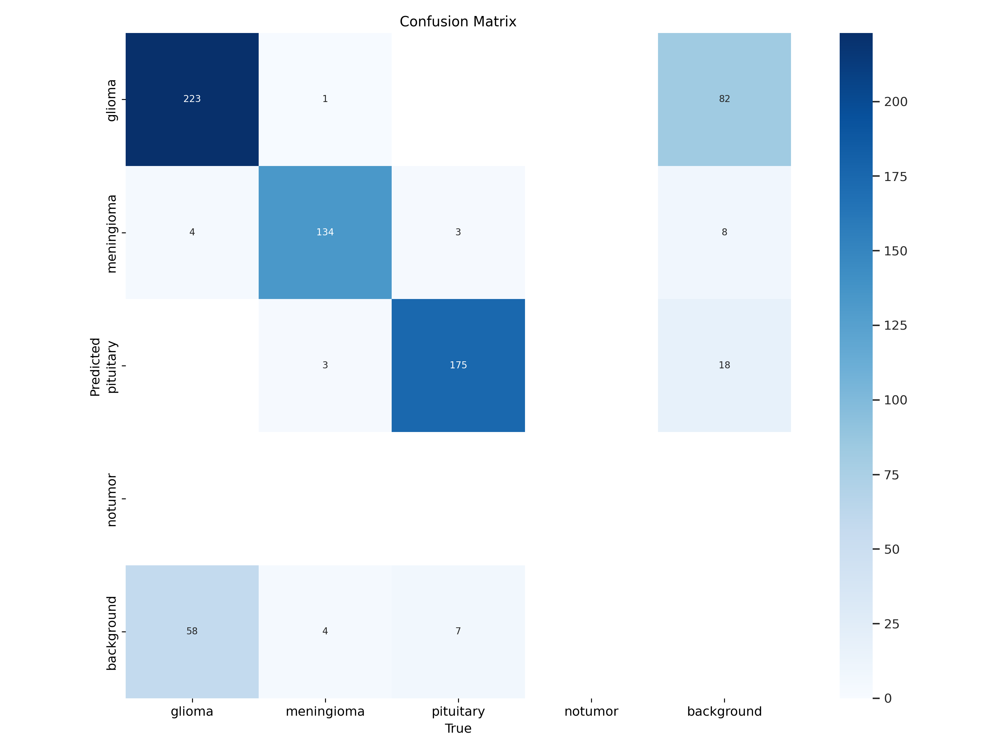

In [ ]:
Image(filename='runs/detect/train17/confusion_matrix.png', width=800)

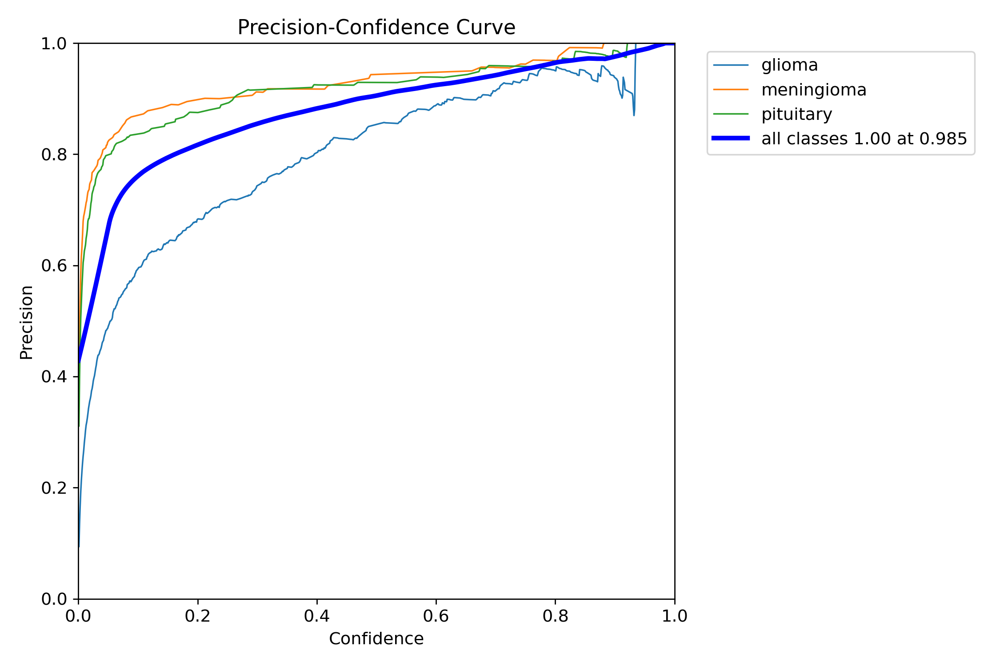

In [ ]:
Image(filename='runs/detect/train17/P_curve.png', width=800)

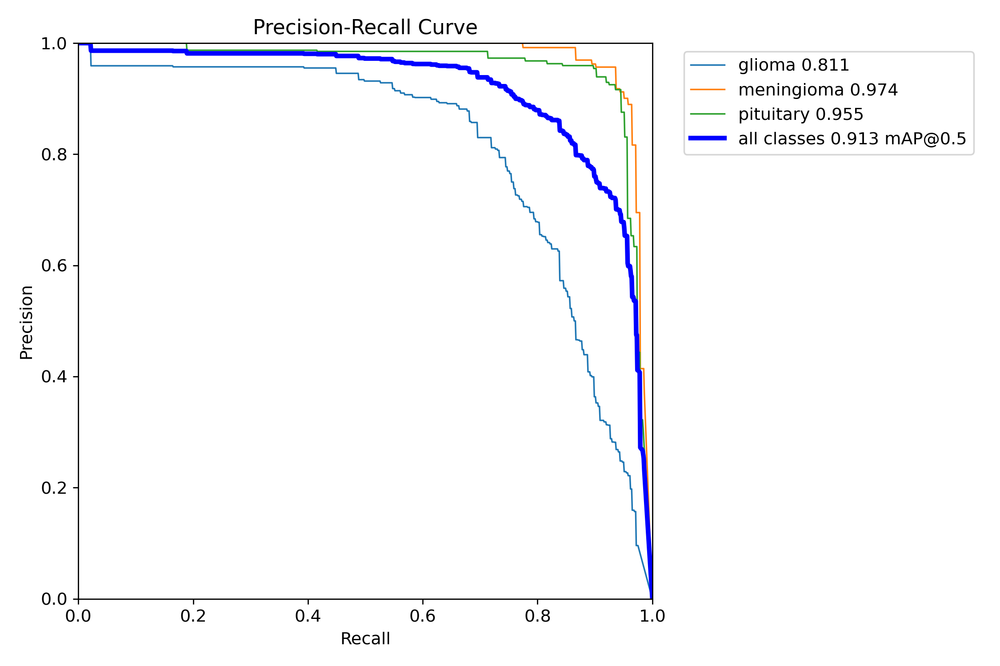

In [ ]:
Image(filename='runs/detect/train17/PR_curve.png', width=800)

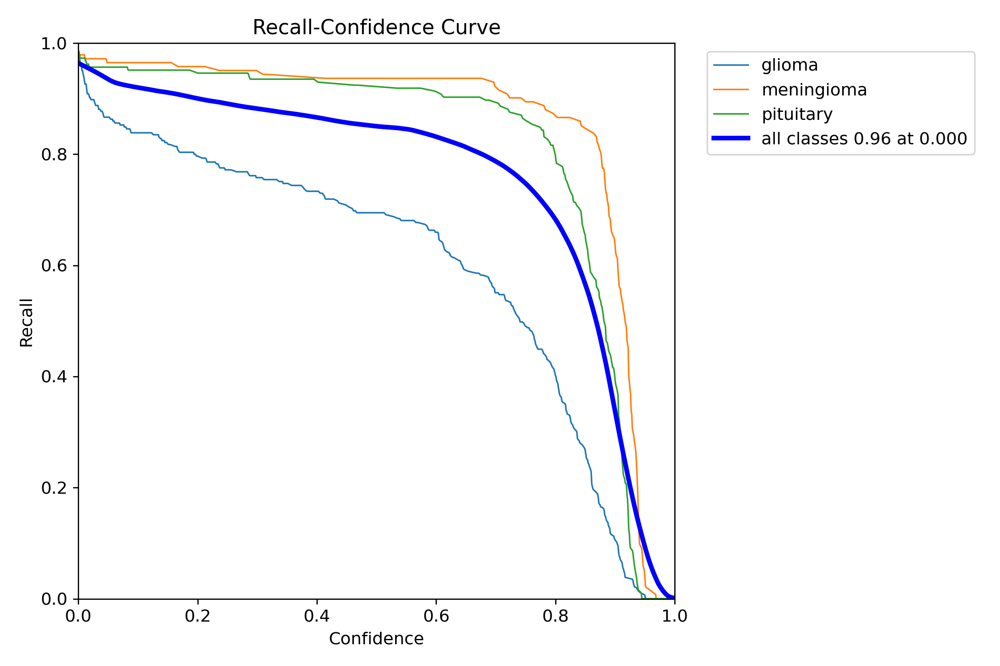

In [ ]:
Image(filename='runs/detect/train17/R_curve.png', width=800)

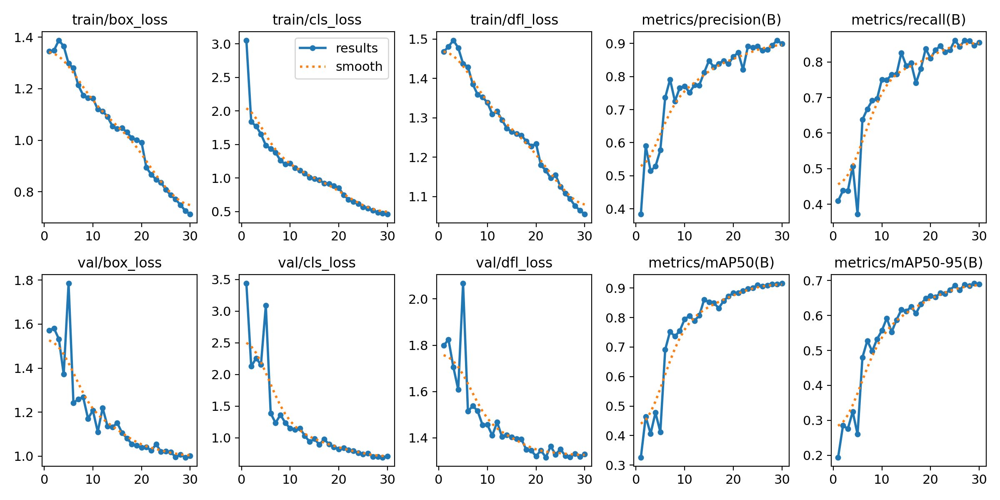

In [ ]:
Image(filename='runs/detect/train17/results.png', width=800)

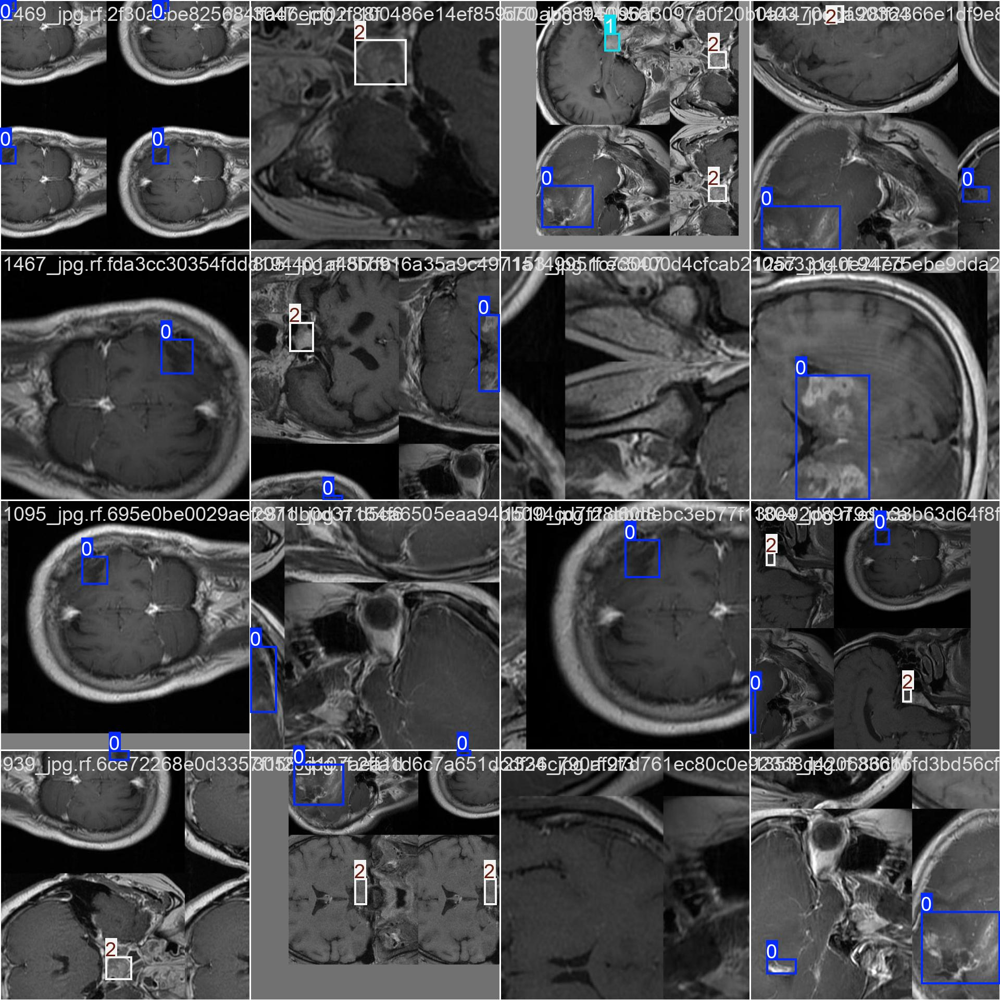

In [ ]:
Image(filename='runs/detect/train17/train_batch0.jpg', width=800)

# **Model Validation**

# **Yolo9**

In [ ]:
!yolo task=detect mode=val model=runs/detect/train20/weights/best.pt data=data.yaml

Ultralytics 8.3.108 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv9s summary (fused): 197 layers, 7,168,636 parameters, 0 gradients, 26.7 GFLOPs
val: Scanning /content/drive/MyDrive/brain_tumor_object_detection/dataset/valid/labels.cache... 612 images, 0 backgrounds, 0 corrupt: 100% 612/612 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 39/39 [00:11<00:00,  3.29it/s]
                   all        612        612      0.829      0.739      0.817      0.597
                glioma        285        285      0.761      0.504      0.654       0.38
            meningioma        142        142      0.941      0.831      0.926      0.764
             pituitary        185        185      0.786      0.881       0.87      0.648
Speed: 0.5ms preprocess, 11.1ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to runs/detect/val8
💡 Learn more at https://docs.ultralytics.com/modes/val


In [ ]:
!ls runs/detect/val8

confusion_matrix_normalized.png  PR_curve.png		val_batch1_labels.jpg
confusion_matrix.png		 R_curve.png		val_batch1_pred.jpg
F1_curve.png			 val_batch0_labels.jpg	val_batch2_labels.jpg
P_curve.png			 val_batch0_pred.jpg	val_batch2_pred.jpg


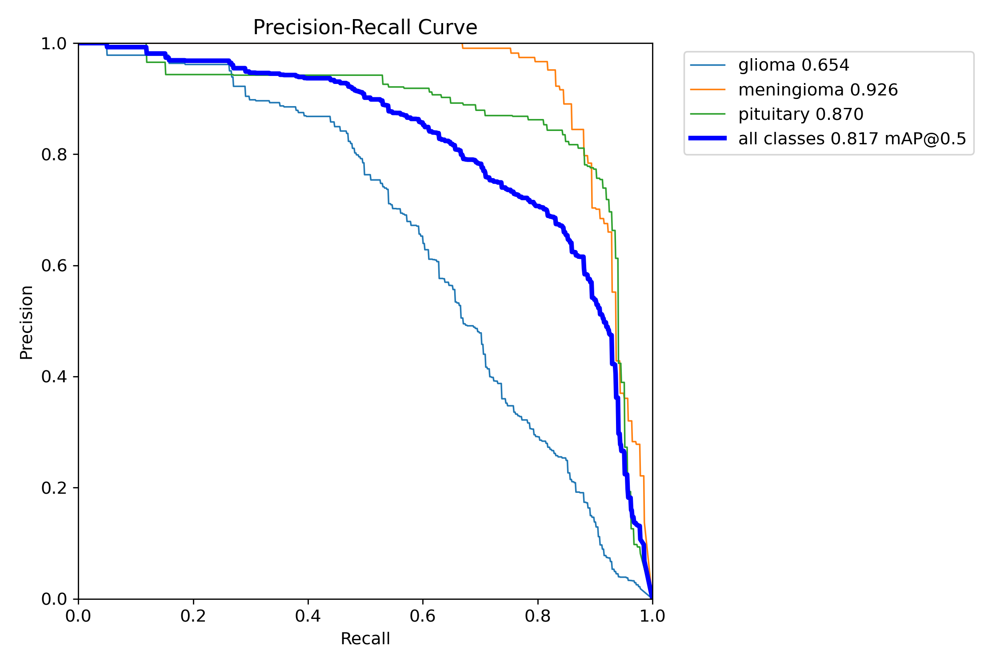

In [ ]:
Image(filename='runs/detect/val8/PR_curve.png', width=1000)

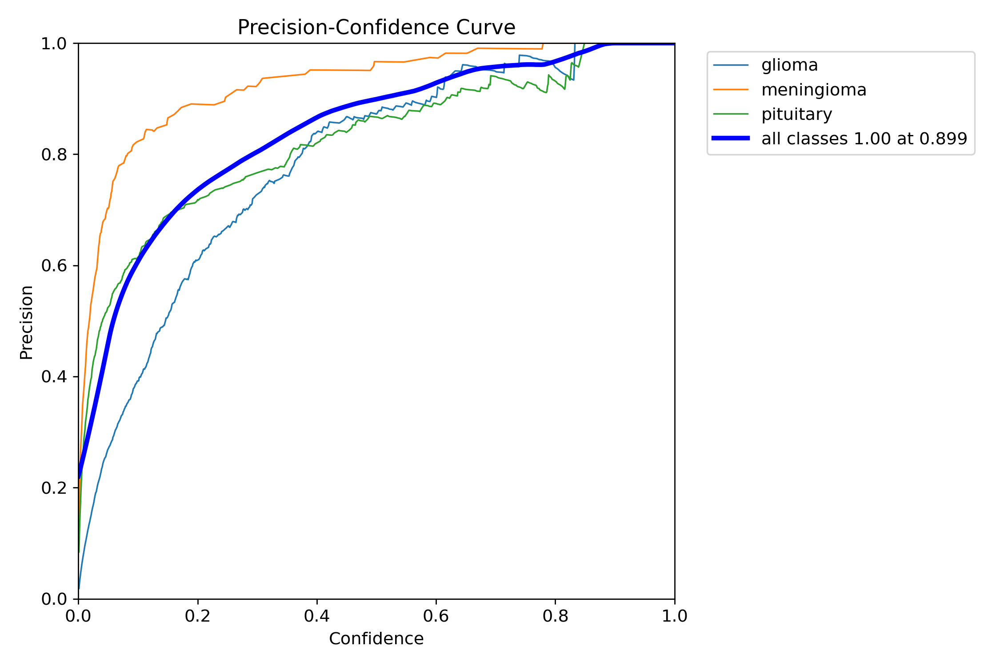

In [ ]:
Image(filename='runs/detect/val8/P_curve.png', width=1000)

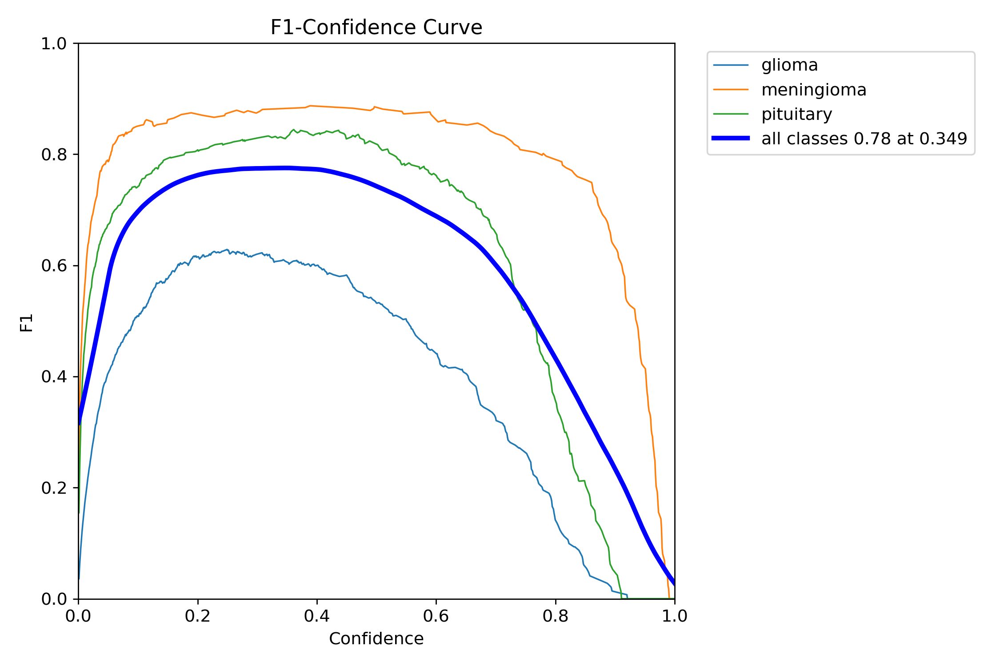

In [ ]:
Image(filename='runs/detect/val8/F1_curve.png', width=1000)

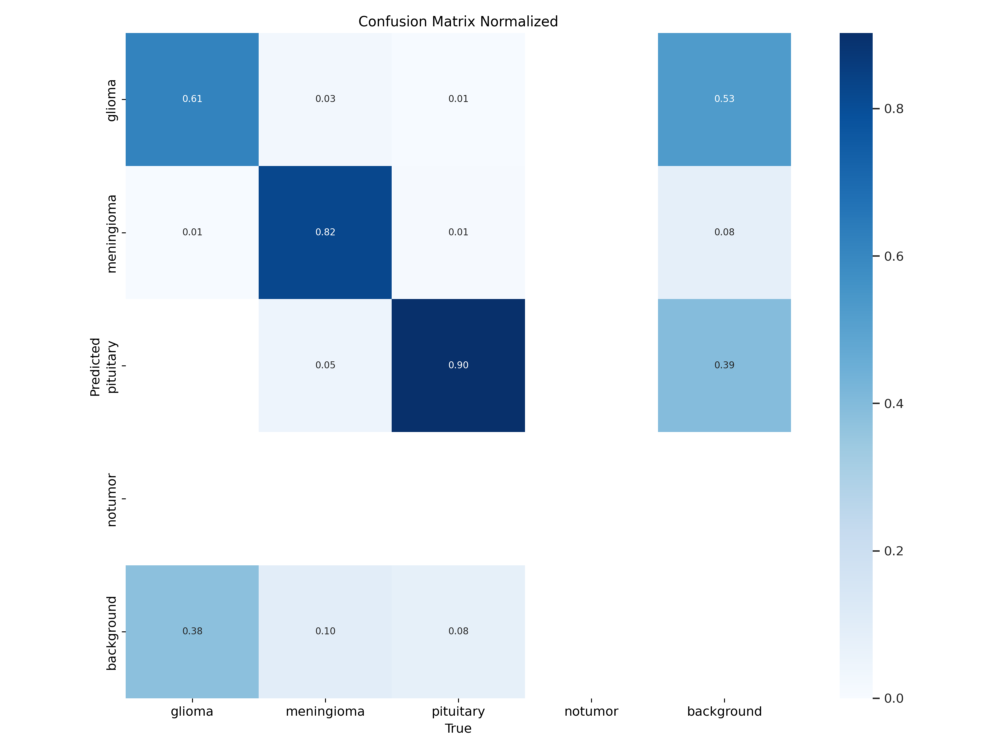

In [ ]:
Image(filename='runs/detect/val8/confusion_matrix_normalized.png', width=1000)

# **Yolo8**

In [ ]:
!yolo task=detect mode=val model=runs/detect/train17/weights/best.pt data=data.yaml

Ultralytics 8.3.108 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,127,132 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /content/drive/MyDrive/brain_tumor_object_detection/dataset/valid/labels.cache... 612 images, 0 backgrounds, 0 corrupt: 100% 612/612 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 39/39 [00:10<00:00,  3.69it/s]
                   all        612        612       0.91      0.847      0.914      0.692
                glioma        285        285      0.855      0.685      0.811      0.521
            meningioma        142        142      0.945      0.937      0.974      0.811
             pituitary        185        185      0.929      0.919      0.955      0.743
Speed: 1.1ms preprocess, 8.5ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to runs/detect/val6
💡 Learn more at https://docs.ultralytics.com/modes/val


In [ ]:
!yolo task=detect mode=val model=runs/detect/train19/weights/best.pt data=data.yaml

Ultralytics 8.3.108 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,127,132 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /content/drive/MyDrive/brain_tumor_object_detection/dataset/valid/labels.cache... 612 images, 0 backgrounds, 0 corrupt: 100% 612/612 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 39/39 [00:10<00:00,  3.64it/s]
                   all        612        612      0.812      0.755      0.829      0.597
                glioma        285        285      0.761      0.568      0.672      0.401
            meningioma        142        142      0.924      0.817      0.927      0.746
             pituitary        185        185      0.751      0.881      0.888      0.645
Speed: 0.8ms preprocess, 8.8ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to runs/detect/val7
💡 Learn more at https://docs.ultralytics.com/modes/val


In [ ]:
!ls runs/detect/val7

confusion_matrix_normalized.png  PR_curve.png		val_batch1_labels.jpg
confusion_matrix.png		 R_curve.png		val_batch1_pred.jpg
F1_curve.png			 val_batch0_labels.jpg	val_batch2_labels.jpg
P_curve.png			 val_batch0_pred.jpg	val_batch2_pred.jpg


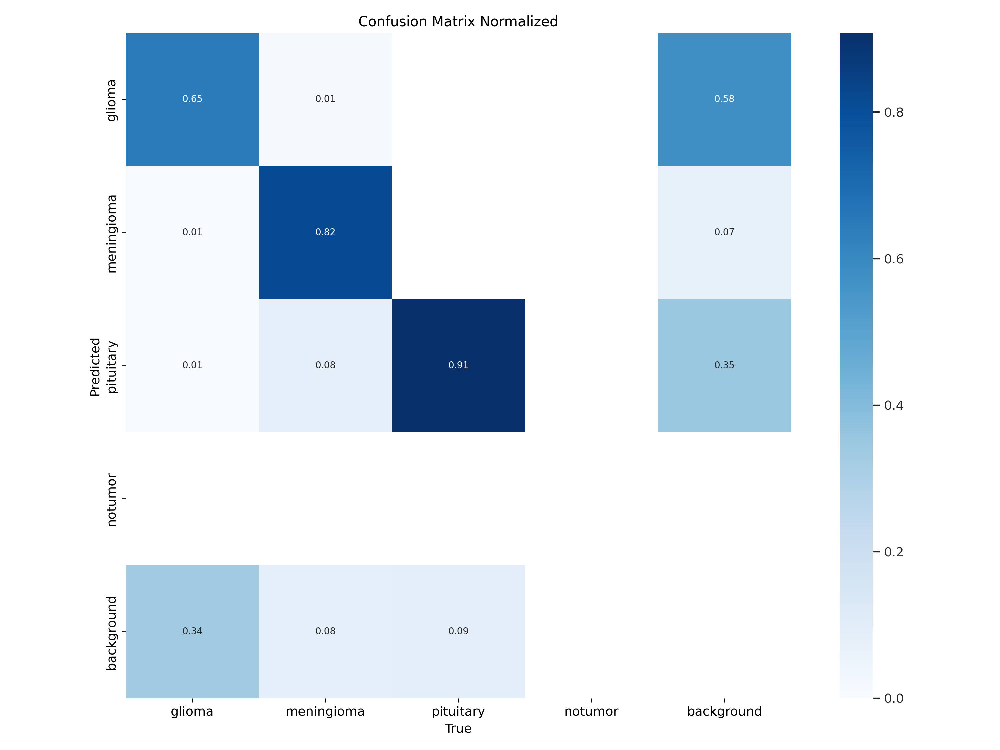

In [ ]:
Image(filename='runs/detect/val7/confusion_matrix_normalized.png', width=1000)

In [ ]:
!ls runs/detect/val6

confusion_matrix_normalized.png  PR_curve.png		val_batch1_labels.jpg
confusion_matrix.png		 R_curve.png		val_batch1_pred.jpg
F1_curve.png			 val_batch0_labels.jpg	val_batch2_labels.jpg
P_curve.png			 val_batch0_pred.jpg	val_batch2_pred.jpg


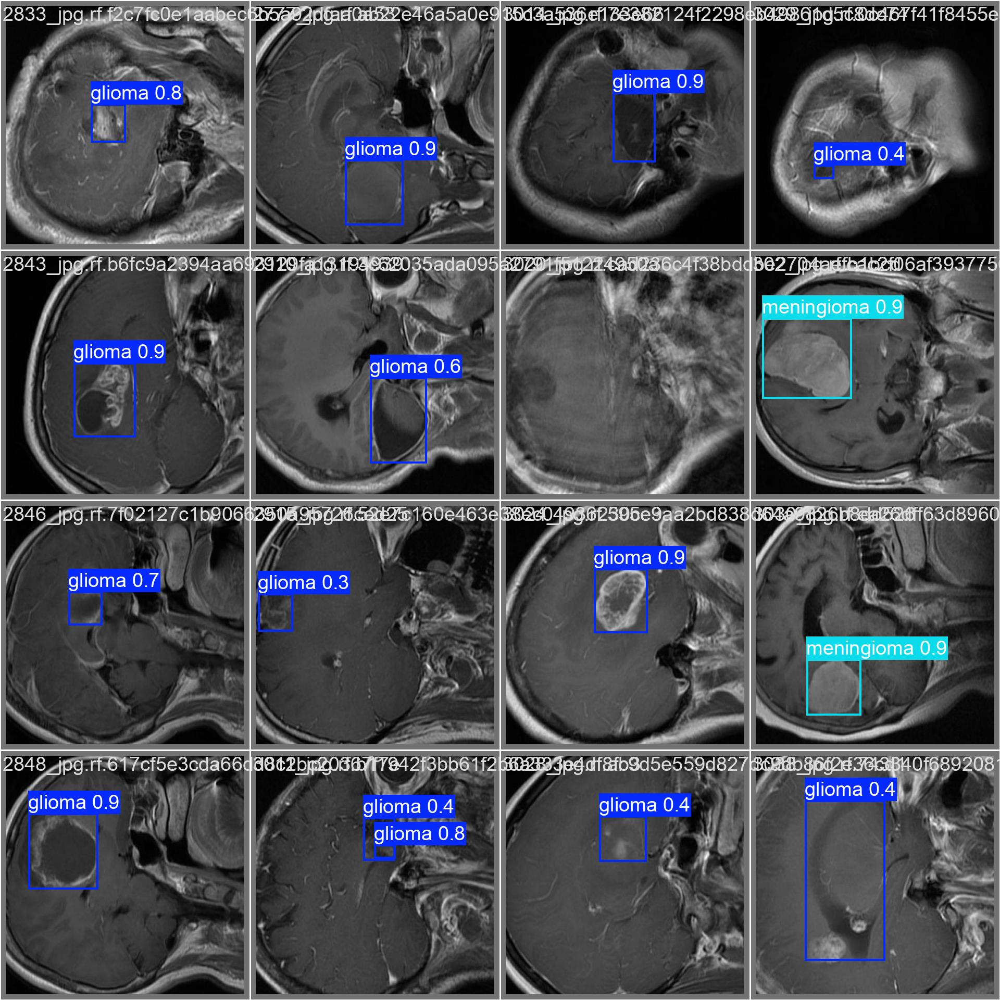

In [ ]:
Image(filename='runs/detect/val6/val_batch2_pred.jpg', width=1000)

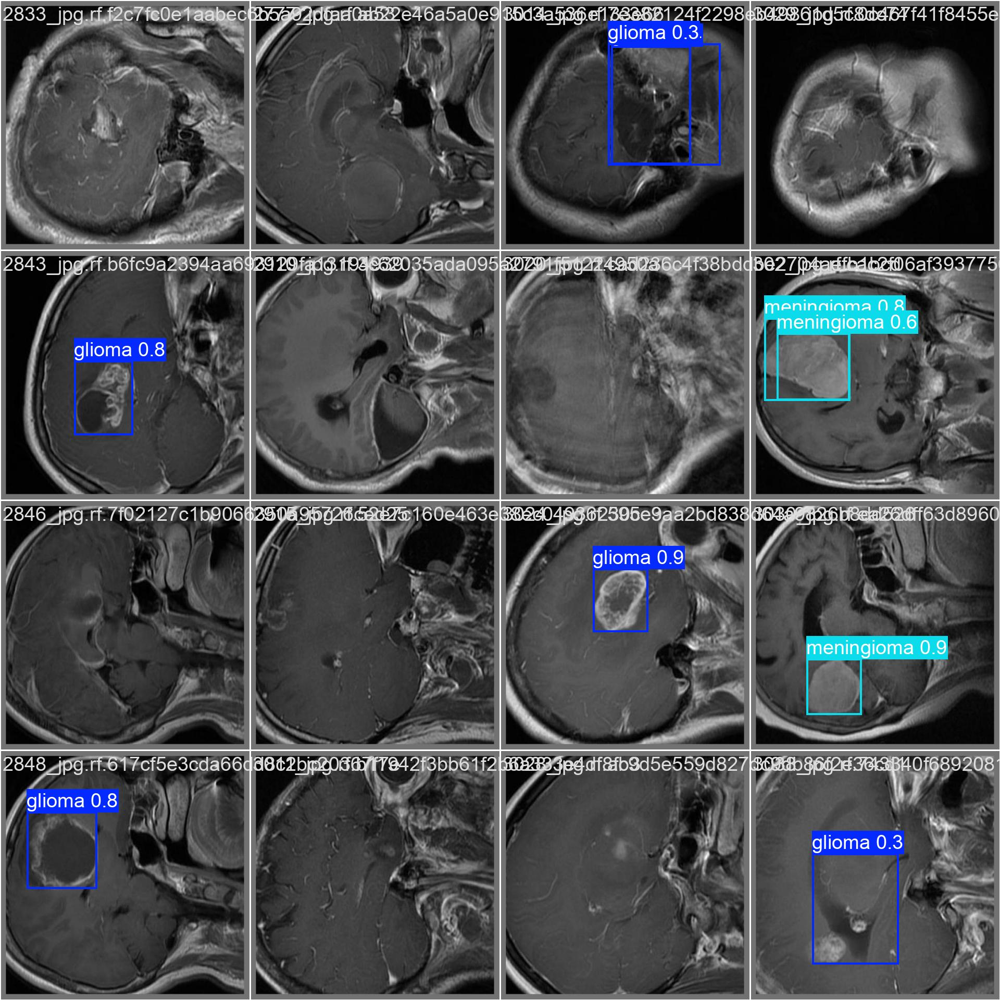

In [ ]:
Image(filename='runs/detect/val7/val_batch2_pred.jpg', width=1000)

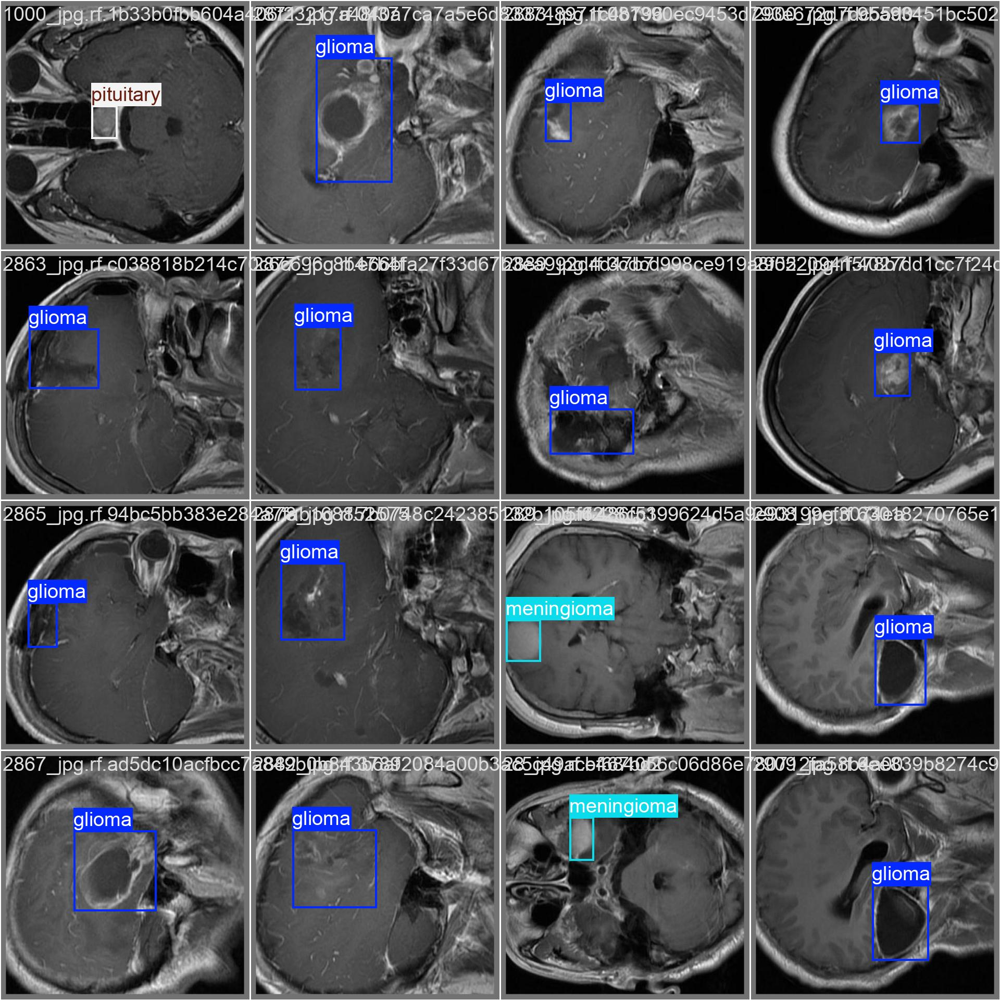

In [ ]:
Image(filename='runs/detect/val6/val_batch0_labels.jpg', width=1000)

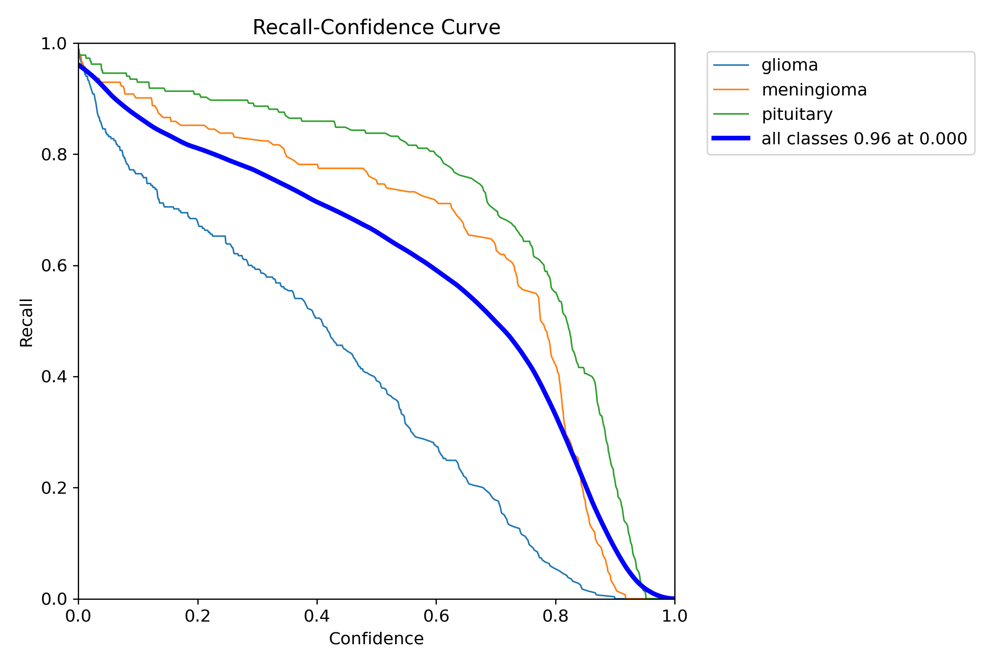

In [ ]:
Image(filename='runs/detect/val7/R_curve.png', width=1000)

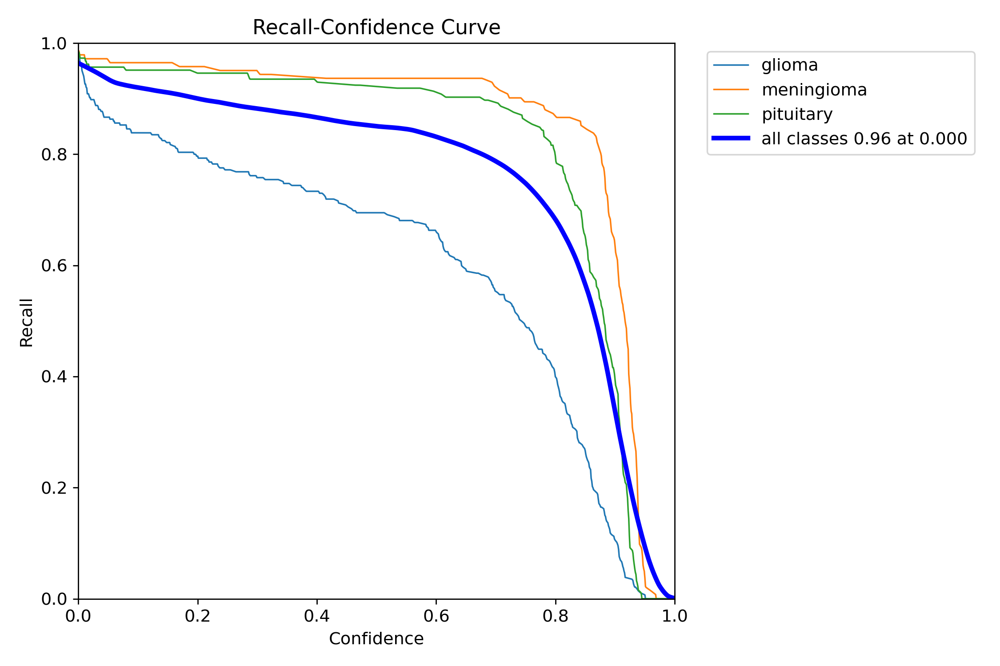

In [ ]:
Image(filename='runs/detect/val6/R_curve.png', width=1000)

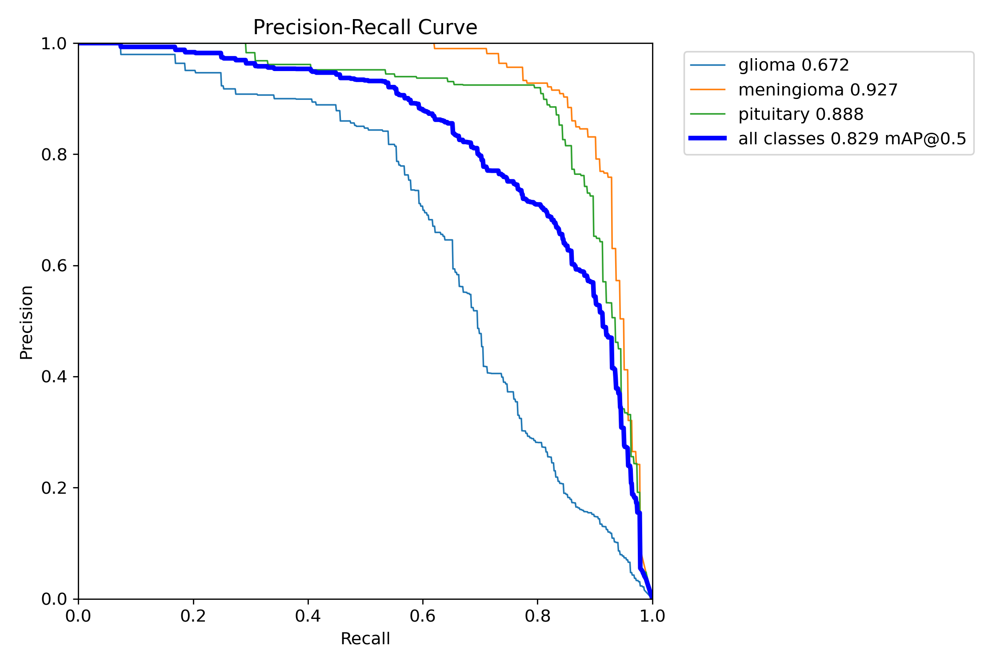

In [ ]:
Image(filename='runs/detect/val7/PR_curve.png', width=1000)

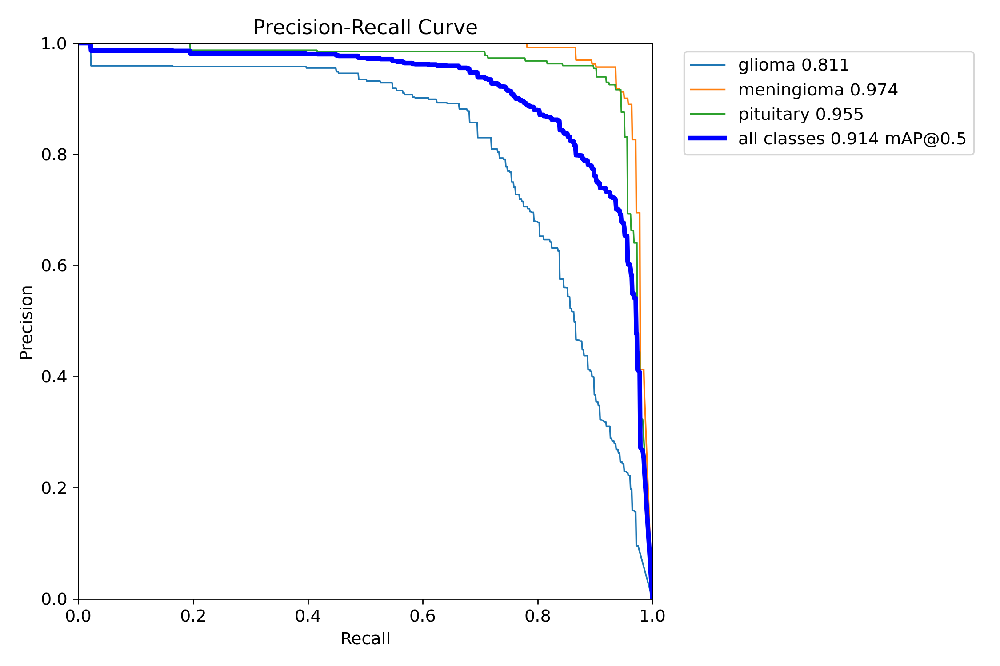

In [ ]:
Image(filename='runs/detect/val6/PR_curve.png', width=1000)

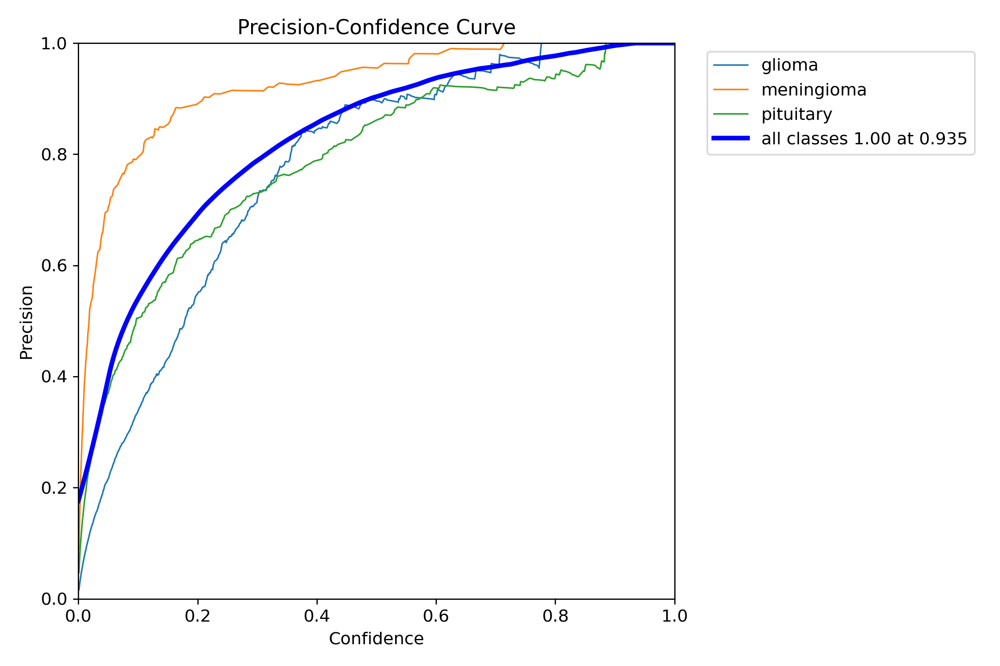

In [ ]:
Image(filename='runs/detect/val7/P_curve.png', width=1000)

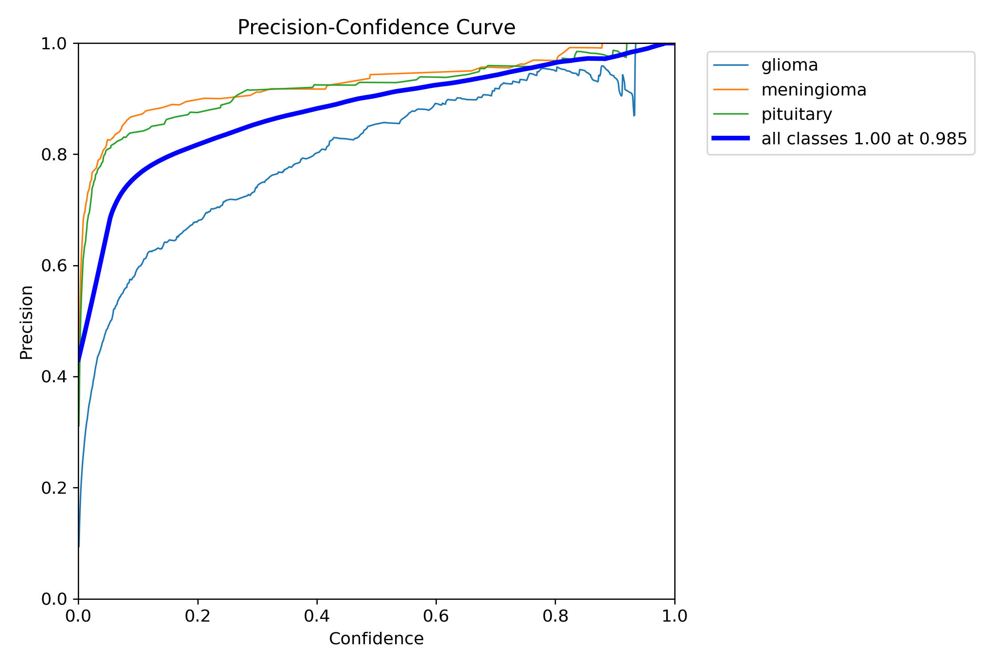

In [ ]:
Image(filename='runs/detect/val6/P_curve.png', width=1000)

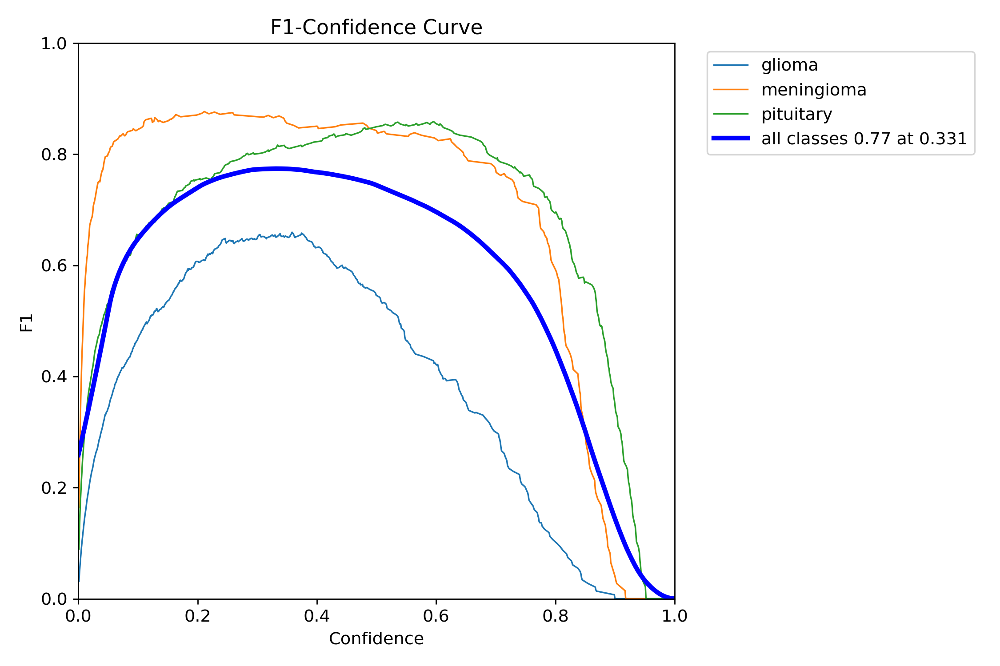

In [ ]:
Image(filename='runs/detect/val7/F1_curve.png', width=1000)

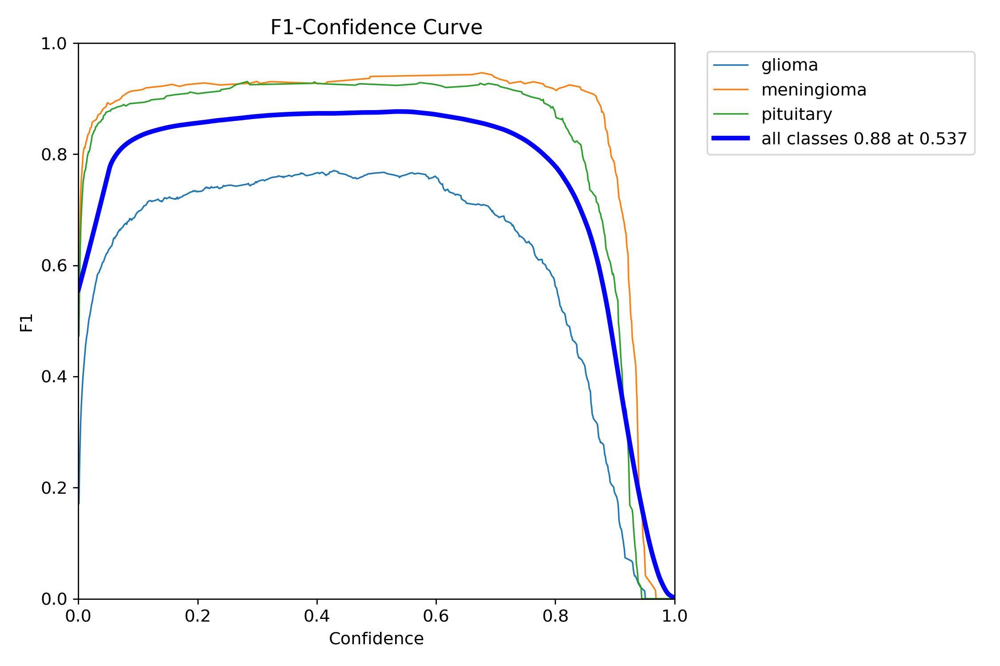

In [ ]:
Image(filename='runs/detect/val6/F1_curve.png', width=1000)

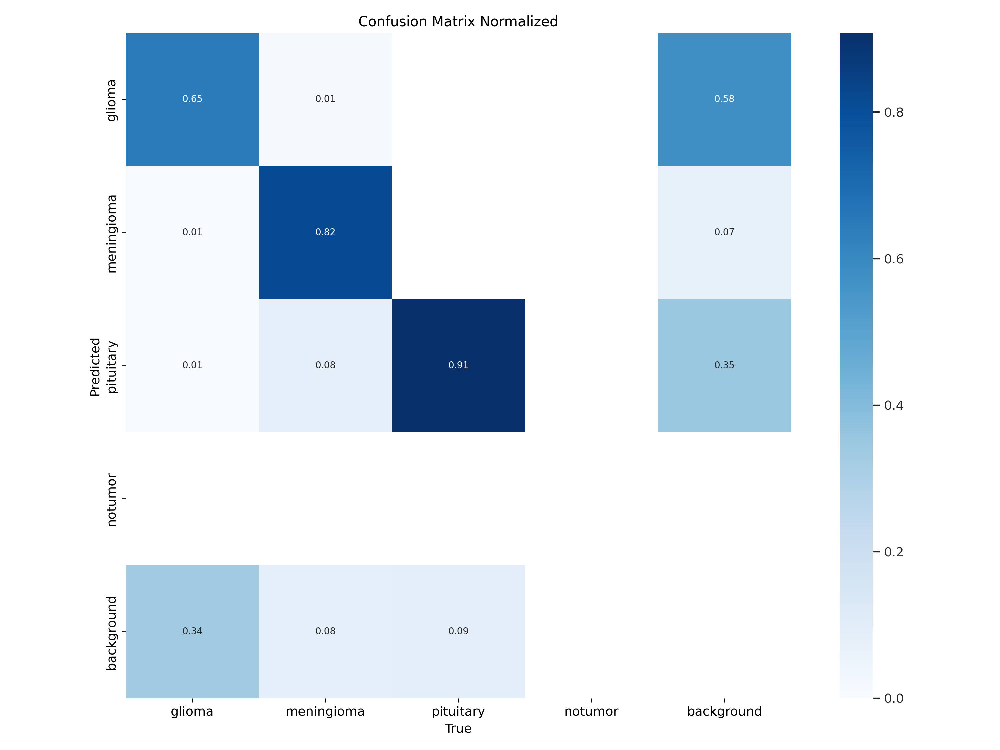

In [ ]:
Image(filename='runs/detect/val7/confusion_matrix_normalized.png', width=1000)

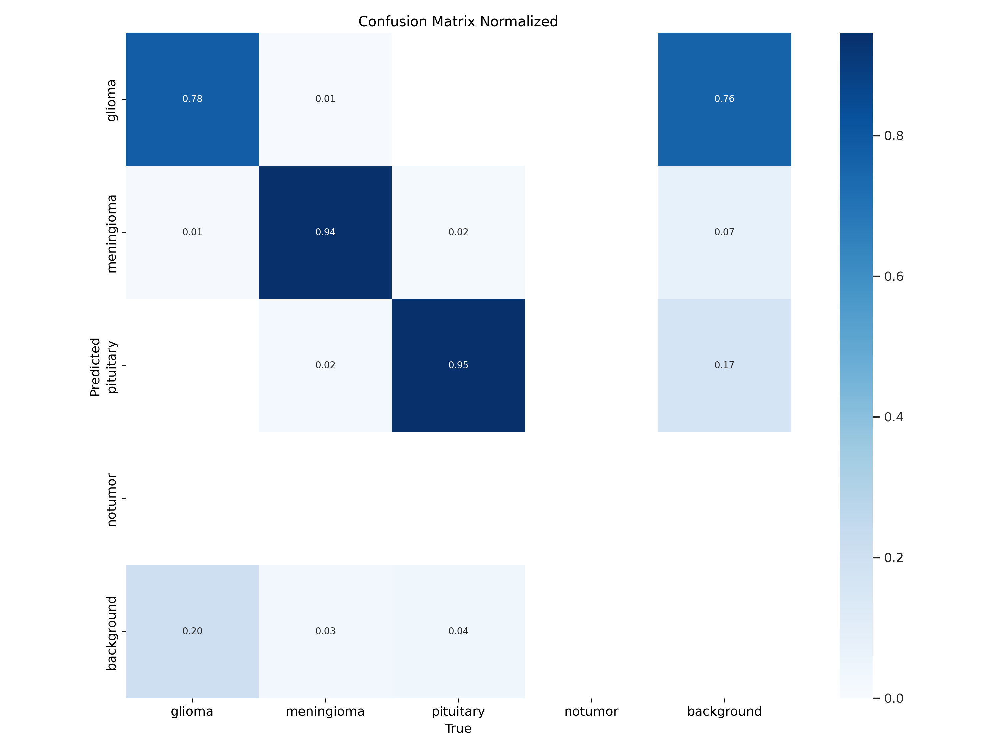

In [ ]:
Image(filename='runs/detect/val6/confusion_matrix_normalized.png', width=1000)